# Homework Assignment 3

Using the [Seattle Library Collection Inventory Dataset](https://www.kaggle.com/city-of-seattle/seattle-library-collection-inventory#library-collection-inventory.csv) and TuriCreate please, answer the following questions:

In [ ]:
!pip install turicreate

In [ ]:
# see more details in the course first lecture
!mkdir /root/.kaggle/
import json
import os

# Installing the Kaggle package
!pip install kaggle

#Important Note: complete this with your own key - after running this for the first time remmember to **remove** your API_KEY
api_token = {"username":"","key":""}

# creating kaggle.json file with the personal API-Key details
# You can also put this file on your Google Drive
with open('/root/.kaggle/kaggle.json', 'w') as file:
  json.dump(api_token, file)
!chmod 600 /root/.kaggle/kaggle.json

mkdir: cannot create directory ‘/root/.kaggle/’: File exists


In [ ]:
# Creating a dataset directory

!mkdir ./datasets
!mkdir ./datasets/library-collection

# download the dataset from Kaggle and unzip it
!kaggle datasets download city-of-seattle/seattle-library-collection-inventory  -f library-collection-inventory.csv -p ./datasets/library-collection/
!unzip ./datasets/library-collection/*.zip  -d ./datasets/library-collection
!ls ./datasets/library-collection


mkdir: cannot create directory ‘./datasets’: File exists
mkdir: cannot create directory ‘./datasets/library-collection’: File exists
library-collection-inventory.csv.zip: Skipping, found more recently modified local copy (use --force to force download)
Archive:  ./datasets/library-collection/library-collection-inventory.csv.zip
replace ./datasets/library-collection/library-collection-inventory.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: ט
error:  invalid response [ט]
replace ./datasets/library-collection/library-collection-inventory.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
  inflating: ./datasets/library-collection/library-collection-inventory.csv  
library-collection-inventory.csv  library-collection-inventory.csv.zip


In [ ]:
import turicreate as tc
%matplotlib inline

#Loading a CSV to SFrame (this can take some time)
sf = tc.SFrame.read_csv("/content/datasets/library-collection/library-collection-inventory.csv", nrows=1000000)
sf

Successfully parsed 10 tokens: 
	0: 735439
	1: ["Genealog ... t.",,1947]
	2: 
	3: Enloes family
	4: arbk
	5: caref
	6: 
	7: cen
	8: 2017-09-01 ... :00:00.000
	9: 1

1 lines failed to parse correctly

Finished parsing file /content/datasets/library-collection/library-collection-inventory.csv

Parsing completed. Parsed 100 lines in 2.42048 secs.

------------------------------------------------------
Inferred types from first 100 line(s) of file as 
column_type_hints=[int,str,str,str,str,str,str,str,str,str,str,str,int]
If parsing fails due to incorrect types, you can correct
the inferred type list above and pass it to read_csv in
the column_type_hints argument
------------------------------------------------------


Successfully parsed 10 tokens: 
	0: 735439
	1: [Genealogy ... t.",,1947]
	2: 
	3: Enloes family
	4: arbk
	5: caref
	6: 
	7: cen
	8: 2017-09-01 ... :00:00.000
	9: 1

Read 158429 lines. Lines per second: 39790.5

Read 633885 lines. Lines per second: 57160.5

Successfully parsed 9 tokens: 
	0: 362786
	1: [Records., ... l Society]
	2: Registers  ... astchester
	3: arbk
	4: caref
	5: 
	6: cen
	7: 2017-09-01 ... :00:00.000
	8: 1

2 lines failed to parse correctly

Finished parsing file /content/datasets/library-collection/library-collection-inventory.csv

Parsing completed. Parsed 1000000 lines in 14.4195 secs.

BibNum,Title,Author,ISBN,PublicationYear
3011076,A tale of two friends /adapted by Ellie O'Ry ...,"O'Ryan, Ellie","1481425730, 1481425749,9781481425735, ...",2014.
2248846,"Naruto. Vol. 1, UzumakiNaruto / story and ar ...","Kishimoto, Masashi, 1974-",1569319006,"2003, c1999."
3209270,"Peace, love & Wi-Fi : aZITS treasury / by Jerry ...","Scott, Jerry, 1955-","144945867X, 9781449458676",2014.
1907265,The Paris pilgrims : anovel / Clancy Carlile. ...,"Carlile, Clancy, 1930-",0786706155,c1999.
1644616,"Erotic by nature : acelebration of life, of ...",,094020813X,"1991, c1988."
1736505,Children of Cambodia'skilling fields : memoirs ...,,"0300068395, 0300078730",c1997.
1749492,Anti-Zionism : analyticalreflections / editors: ...,,091559773X,c1989.
3270562,Hard-hearted Highlander /Julia London. ...,"London, Julia","0373789998, 037380394X,9780373789993, ...",[2017]
3264577,The Sandcastle Empire /Kayla Olson. ...,"Olson, Kayla","0062484877, 9780062484871",2017.
3236819,Doctor Who. The return ofDoctor Mysterio / BBC ; ...,,,[2017]


In [ ]:
#sf.show()

**Question 1:** Write a function that returns the most popular book in each subject. Use it to find the most popular book in
    the _Mystery Fiction_ subject (15pt)

In [ ]:
sf2 = sf['BibNum', 'Subjects', 'Title', 'ItemCount','PublicationYear','Author'] # remove duplications
sf2['subject_list'] = sf2['Subjects'].apply(lambda s: s.split(","))
sf2['subject_list'] = sf2['subject_list'].apply(lambda l: [subject.strip() for subject in l])
sf2 = sf2.remove_column('Subjects')
# we want to remove the duplication of subject by specific books
sf2 = sf2.unique()
sf2

Author,BibNum,ItemCount,PublicationYear,Title
"Gudis, Catherine",2243760,1,2004.,"Buyways : billboards,automobiles, and the ..."
,3206619,4,[2016],All the way[videorecording] / HBO ...
"Radzinskiĭ, Ėdvard",1399096,1,1993.,"""Gospodi-- spasi i usmiriRossi︠i︡u"" : Nikolaĭ II, ..."
,3160527,4,[2016],The Danish girl[videorecording] / Focus ...
,3197802,2,[2016],Indian summers. Thecomplete second season ...
"Nagata, Linda",3126085,2,[2015],The trials / LindaNagata. ...
"Erikson, Steven",2605540,1,2009.,Bauchelain and KorbalBroach / Steven Erikson. ...
Hispanic Society ofAmerica ...,730279,2,1930-,Catalogue of sculpture... in the collection of ...
,2496903,1,[2007],Sha shou hu die meng[videorecording] = My ...
"Woodward, Bob, 1943-",3132190,1,2015.,The last of thepresident's men / Bob ...


In [ ]:
import re
r = re.compile('\\d{4}')
def get_year(y_str):
    l = r.findall(y_str) # take the first year
    if len(l) == 0:
        return None
    return int(l[0])

sf2['year'] = sf2['PublicationYear'].apply(lambda s: get_year(s))
sf2['year']

dtype: int
Rows: 547147
[2004, 2016, 1993, 2016, 2016, 2015, 2009, 1930, 2007, 2015, 1975, 1989, 2013, 1993, 1998, 2009, 1972, 2014, 2015, 2017, 2008, 2016, 2017, 2015, 2015, 2009, 2013, 2016, 2011, 2005, 2017, 2012, 1961, 2012, 2016, 1983, 1918, 2016, 1992, 2012, 2016, 2011, 2016, 2001, 1997, 2013, 2004, 2008, 2015, 2016, 2006, 2014, 2014, 2017, 2005, 2010, 2017, 1987, 1995, 2015, 2011, 2008, 2000, 1995, 2014, 2012, 2014, 2014, 1954, 2017, 2014, 2014, 2006, 2004, 2008, 1987, 2003, 1940, 2012, 2013, 1981, 2016, 1999, 2015, 2014, 2012, 2003, 2010, 1984, 2015, 1982, 2000, 2014, 2007, 2010, 1977, 1981, 1923, 2014, 1950, ... ]

In [ ]:
sf2 = sf2.stack("subject_list", new_column_name="subject")
sf2['subject']

dtype: str
Rows: 1878165
['Advertising Outdoor United States History 20th century', 'Billboards United States History 20th century', 'Consumption Economics United States History 20th century', 'Automobile travel United States History 20th century', 'Johnson Lyndon B Lyndon Baines 1908 1973 Drama', 'Civil rights movements Drama', 'Presidents Drama', 'United States Politics and government 1963 1969', 'Biographical films', 'Historical films', 'Feature films', 'Video recordings for the hearing impaired', 'Nicholas II Emperor of Russia 1868 1918 Assassination', 'Nicholas II Emperor of Russia 1868 1918 Family', 'Elbe Lili 1882 1931 Drama', 'Wegener Gerda Drama', 'Transgender artists Drama', 'Transgender people Drama', 'Marriage Drama', 'Artists Drama', 'Biographical films', 'Fiction films', 'Feature films', 'Video recordings for the hearing impaired', 'India History British occupation 1765 1947 Drama', 'Cultural pluralism Drama', 'Television series', 'Historical television programs', 'Fictio

In [ ]:
sf2['subject'] = sf2['subject'].apply(lambda name: name.lower())
sf2

Author,BibNum,ItemCount,PublicationYear,Title,year
"Gudis, Catherine",2243760,1,2004.,"Buyways : billboards,automobiles, and the ...",2004
"Gudis, Catherine",2243760,1,2004.,"Buyways : billboards,automobiles, and the ...",2004
"Gudis, Catherine",2243760,1,2004.,"Buyways : billboards,automobiles, and the ...",2004
"Gudis, Catherine",2243760,1,2004.,"Buyways : billboards,automobiles, and the ...",2004
,3206619,4,[2016],All the way[videorecording] / HBO ...,2016
,3206619,4,[2016],All the way[videorecording] / HBO ...,2016
,3206619,4,[2016],All the way[videorecording] / HBO ...,2016
,3206619,4,[2016],All the way[videorecording] / HBO ...,2016
,3206619,4,[2016],All the way[videorecording] / HBO ...,2016
,3206619,4,[2016],All the way[videorecording] / HBO ...,2016


In [ ]:
import turicreate.aggregate as agg

def most_popular_in_subject():
  sum = sf2.groupby(['Title', 'subject'],{'BooksNum': agg.SUM('ItemCount')})
  max = sum.groupby(['subject'],{'MaxBook': agg.MAX('BooksNum')})
  max_books = max.join(sum, on={'subject':'subject', 'MaxBook':'BooksNum'}, how="inner")

  return max_books.sort('MaxBook', ascending=False)


In [ ]:
popular = most_popular_in_subject()
popular.print_rows(100)

+--------------------------------+---------+--------------------------------+
|            subject             | MaxBook |             Title              |
+--------------------------------+---------+--------------------------------+
|                                |   5604  |                                |
| materials testing standard...  |   632   | Annual book of ASTM standards. |
| materials standards united...  |   632   | Annual book of ASTM standards. |
|          aeronautics           |   411   | Technical note - National ...  |
|  fire extinction periodicals   |   358   |      National fire codes.      |
| fire prevention united sta...  |   358   |      National fire codes.      |
| trademarks united states p...  |   341   | Official gazette of the Un...  |
|    united states genealogy     |   333   | Lineage book, National Soc...  |
| united states history revo...  |   333   | Lineage book, National Soc...  |
| united states history revo...  |   333   | Lineage book, Natio

In [ ]:
# I could not load all the data - I search for the Short stories American instead of Mystery Fiction
popular[popular['subject'] == 'short stories american']

subject,MaxBook,Title
short stories american,15,The Saturday evening poststories. ...


**Question 2**: Find the top-10 fiction subjects (5pt), and use Seaborn to visualize the number of items over time for each subject (15pt)
    

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
sns.set() # set style to seaborn defaults

top_ten = popular[popular['subject'].contains('fiction')][:10]
top_ten.print_rows()


+-------------------------------+---------+-------------------------------+
|            subject            | MaxBook |             Title             |
+-------------------------------+---------+-------------------------------+
|     science fiction films     |   222   | Arrival / Paramount Pictur... |
|         fiction films         |   222   | Arrival / Paramount Pictur... |
|  women crimes against fiction |   155   | Into the water / Paula Haw... |
|         murder fiction        |   155   | Into the water / Paula Haw... |
|       thrillers fiction       |   155   | Into the water / Paula Haw... |
|         rivers fiction        |   155   | Into the water / Paula Haw... |
|     psychological fiction     |   155   | Into the water / Paula Haw... |
|       historical fiction      |   150   | The Underground Railroad :... |
| united states history 19th... |   150   | The Underground Railroad :... |
| fugitive slaves united sta... |   150   | The Underground Railroad :... |
+-----------

In [ ]:
top_ten_count_year = sf2.groupby(['subject', 'year'],{'count': agg.SUM('ItemCount')}).filter_by(list(top_ten['subject']),'subject')
top_ten_count_year

subject,year,count
psychological fiction,2012,263
fiction films,2000,215
fiction films,1977,1
historical fiction,1894,4
historical fiction,1983,11
science fiction films,2009,73
psychological fiction,2004,203
historical fiction,1980,6
psychological fiction,None,1
historical fiction,2007,267


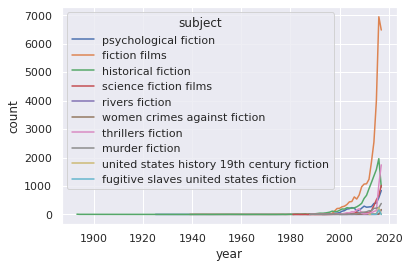

In [ ]:
df = top_ten_count_year.to_dataframe()
sns.set_style()
g = sns.lineplot(data=df, x="year", y="count", hue="subject")


**Question 3:** Write a function that gets as input a subject name. The function returns the top-20 most _popular_ authors for the input subject (15pt).



In [ ]:
def most_popular_author_in_subject(subject):
  authors = sf2[sf2["Author"] != ""]
  authors = authors[authors["subject"] == subject]
  authors_popular = authors.groupby(['Author'],{'BooksNum': agg.SUM('ItemCount')})

  return authors_popular.sort('BooksNum', ascending=False)[:20]

In [ ]:
most_popular_author_in_subject('psychological fiction').print_rows()

+-------------------------+----------+
|          Author         | BooksNum |
+-------------------------+----------+
|      Hawkins, Paula     |   188    |
|       Ware, Ruth.       |   122    |
|      Lehane, Dennis     |    97    |
|        See, Lisa        |    93    |
| Adebayo, Ayobami, 1988- |    65    |
|     Honeyman, Gail.     |    57    |
|       McEwan, Ian       |    51    |
|   Kellerman, Jonathan   |    40    |
|      Hoffman, Alice     |    31    |
|    Kitamura, Katie M.   |    27    |
+-------------------------+----------+
[20 rows x 2 columns]



Using the [The Blog Authorship Corpus](https://www.kaggle.com/rtatman/blog-authorship-corpus.htm) and TuriCreate, please answer the following questions:

**Question 4:** Calculate the average and median age of bloggers in each topic by gender(5pt).
Calculate the average and median age of bloggers according to their sign (5pt).
Visualize the age distributions  of bloggers according to their  topic and gender using Seaborn and PlotlyExpress(15pt)

https://www.kaggle.com/datasets/rtatman/blog-authorship-corpus

In [ ]:
!kaggle datasets list -s blogtext

ref                                   title          size  lastUpdated          downloadCount  voteCount  usabilityRating  
------------------------------------  ------------  -----  -------------------  -------------  ---------  ---------------  
datasets/dsrivastava2020/blogtextcsv  blogtext.csv  290MB  2021-05-29 16:39:33             60          1  0.23529412       


In [ ]:
# Creating a dataset directory
!mkdir ./datasets/blogtext

# download the dataset from Kaggle and unzip it
!kaggle datasets download dsrivastava2020/blogtextcsv -p ./datasets/blogtext
!unzip ./datasets/blogtext/blogtextcsv.zip -d ./datasets/blogtext/

mkdir: cannot create directory ‘./datasets/blogtext’: File exists
 94% 273M/290M [00:01<00:00, 212MB/s]
100% 290M/290M [00:01<00:00, 196MB/s]
Archive:  ./datasets/blogtext/blogtextcsv.zip
  inflating: ./datasets/blogtext/blogtext.csv  


In [ ]:
import pandas as pd
%matplotlib inline

#Loading a CSV to SFrame (this can take some time)
sf = tc.SFrame.read_csv("/content/datasets/blogtext/blogtext.csv")
sf

Finished parsing file /content/datasets/blogtext/blogtext.csv

Parsing completed. Parsed 100 lines in 1.22551 secs.

------------------------------------------------------
Inferred types from first 100 line(s) of file as 
column_type_hints=[int,str,int,str,str,str,str]
If parsing fails due to incorrect types, you can correct
the inferred type list above and pass it to read_csv in
the column_type_hints argument
------------------------------------------------------


Read 44265 lines. Lines per second: 30396

Read 363396 lines. Lines per second: 51060.4

Read 626074 lines. Lines per second: 51281.3

Finished parsing file /content/datasets/blogtext/blogtext.csv

Parsing completed. Parsed 681284 lines in 12.7113 secs.

id,gender,age,topic,sign,date,text
2059027,male,15,Student,Leo,"14,May,2004","Info has beenfound (+/- 100 pages, ..."
2059027,male,15,Student,Leo,"13,May,2004",These are theteam members: Drewes ...
2059027,male,15,Student,Leo,"12,May,2004",In het kadervan kernfusie op aarde: ...
2059027,male,15,Student,Leo,"12,May,2004",testing!!!testing!!! ...
3581210,male,33,InvestmentBanking,Aquarius,"11,June,2004",Thanks toYahoo!'s Toolbar I can ...
3581210,male,33,InvestmentBanking,Aquarius,"10,June,2004",I had aninteresting conversation ...
3581210,male,33,InvestmentBanking,Aquarius,"10,June,2004",SomehowCoca-Cola has a way of ...
3581210,male,33,InvestmentBanking,Aquarius,"10,June,2004","If anything,Korea is a country of ..."
3581210,male,33,InvestmentBanking,Aquarius,"10,June,2004",Take a readof this news article ...
3581210,male,33,InvestmentBanking,Aquarius,"09,June,2004",I surf theEnglish news sites a lot ...


In [ ]:
# Calculate the average and median age of bloggers in each topic by gender
average_age_topic = sf.groupby(['topic','gender'],{'average_age': agg.AVG('age')})
average_age_topic.print_rows()

median_age_topic = sf.groupby(['topic','gender'],{'median_age': agg.QUANTILE('age', 0.5)})
median_age_topic['median_age'] = median_age_topic['median_age'].apply(lambda age: age[0])
median_age_topic.print_rows()

+--------+--------------+--------------------+
| gender |    topic     |    average_age     |
+--------+--------------+--------------------+
| female |  Non-Profit  | 24.695020188425303 |
|  male  |  Non-Profit  | 20.94085281980743  |
| female |   Science    | 25.451525423728814 |
|  male  |   Science    | 24.21648529752258  |
| female |   Student    | 17.772081363329352 |
| female | Construction | 27.523316062176164 |
|  male  |   Student    | 18.02407852824547  |
|  male  | Construction |  32.2295719844358  |
| female |   Military   | 23.717005076142133 |
|  male  |   Military   | 26.836324786324788 |
+--------+--------------+--------------------+
[80 rows x 3 columns]

+--------+--------------+------------+
| gender |    topic     | median_age |
+--------+--------------+------------+
| female |  Non-Profit  |    24.0    |
|  male  |  Non-Profit  |    17.0    |
| female |   Science    |    25.0    |
|  male  |   Science    |    25.0    |
| female |   Student    |    16.0    |
| femal

In [ ]:
# Calculate the average and median age of bloggers according to their sign
average_age_sign = sf.groupby(['sign'],{'average_age': agg.AVG('age')})
average_age_sign.print_rows()

median_age_sign = sf.groupby(['sign'],{'median_age': agg.QUANTILE('age', 0.5)})
median_age_sign['median_age'] = median_age_sign['median_age'].apply(lambda age: age[0])
median_age_sign.print_rows()

+-------------+--------------------+
|     sign    |    average_age     |
+-------------+--------------------+
| Sagittarius | 23.752478215684707 |
|   Scorpio   | 23.63433109987579  |
|   Aquarius  | 23.537182764103306 |
|    Gemini   | 23.94419544099256  |
|     Leo     | 23.779171544851426 |
|  Capricorn  | 24.09839230909939  |
|    Cancer   | 24.470437215594625 |
|    Aries    | 25.18413641330276  |
|    Pisces   | 25.033319149723397 |
|    Virgo    | 23.780642063610316 |
+-------------+--------------------+
[12 rows x 2 columns]

+-------------+------------+
|     sign    | median_age |
+-------------+------------+
| Sagittarius |    24.0    |
|   Scorpio   |    23.0    |
|   Aquarius  |    24.0    |
|    Gemini   |    24.0    |
|     Leo     |    24.0    |
|  Capricorn  |    24.0    |
|    Cancer   |    25.0    |
|    Aries    |    24.0    |
|    Pisces   |    24.0    |
|    Virgo    |    24.0    |
+-------------+------------+
[12 rows x 2 columns]



In [ ]:
# Visualize the age distributions of bloggers according to their topic and gender using Seaborn and PlotlyExpress
import plotly.express as px

df = sf[['age','topic', 'gender']].to_dataframe()
fig = px.scatter_3d(df, x="topic", y="age", z="gender", color="gender")
fig.show()

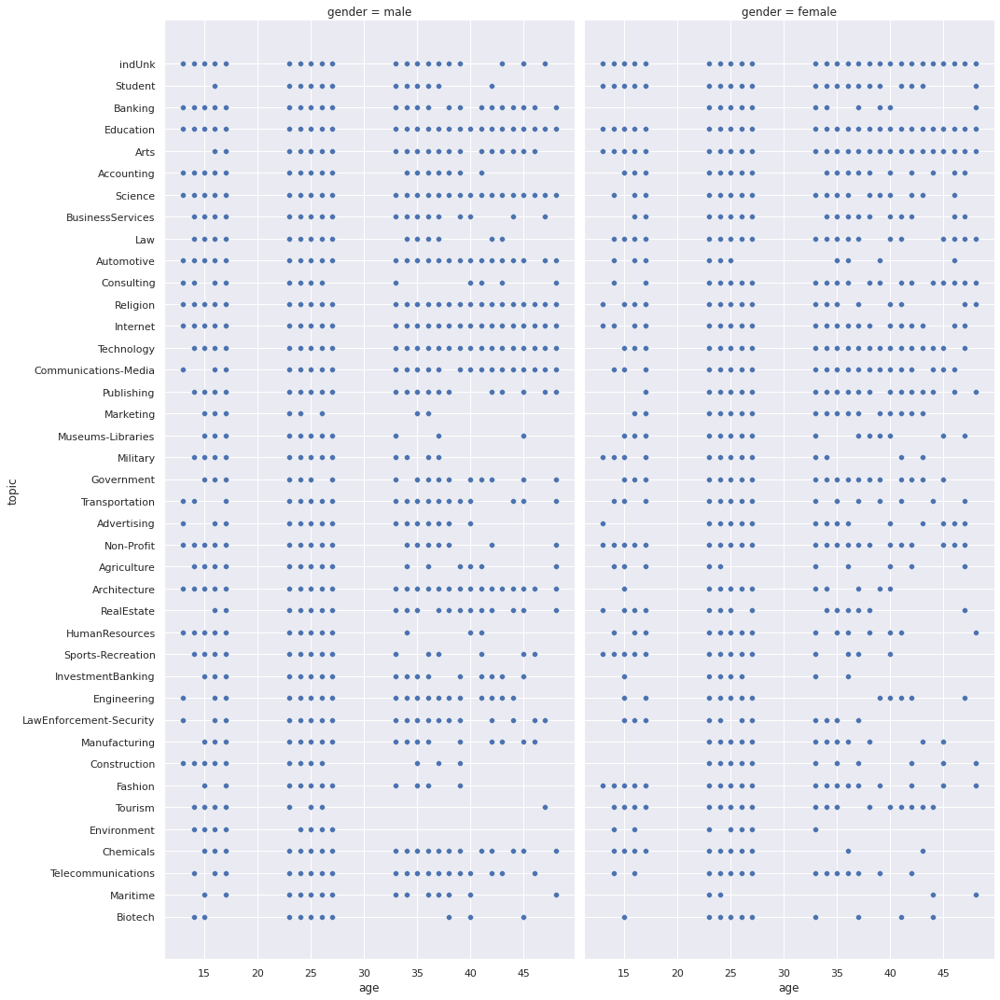

In [ ]:
sns.relplot(data=df, x="age", y="topic", col="gender",height=15, aspect=0.5)

**Question 5:** Using the  [SJR Journal Ranking of 2018](https://www.scimagojr.com/journalrank.php) dataset and Seaborn, visualize
    the H-index distributions according to the SJR Best Quartile (15pt). Using a grid, visualize the _Cites / Doc. (2years)_ histograms values of each publisher (15pt).
    


In [ ]:
!mkdir ./datasets/sjr/
!wget -O ./datasets/sjr/sjr2018.csv https://www.scimagojr.com/journalrank.php?out=xls

--2022-04-17 13:38:41--  https://www.scimagojr.com/journalrank.php?out=xls
Resolving www.scimagojr.com (www.scimagojr.com)... 94.130.25.5
Connecting to www.scimagojr.com (www.scimagojr.com)|94.130.25.5|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [text/csv]
Saving to: ‘./datasets/sjr/sjr2018.csv’

./datasets/sjr/sjr2     [     <=>            ]   8.65M  8.82MB/s    in 1.0s    

2022-04-17 13:38:45 (8.82 MB/s) - ‘./datasets/sjr/sjr2018.csv’ saved [9068260]



In [ ]:
import turicreate as tc
import seaborn as sns
sf = tc.SFrame.read_csv("./datasets/sjr/sjr2018.csv", delimiter=";")
sf

Finished parsing file /content/datasets/sjr/sjr2018.csv

Parsing completed. Parsed 100 lines in 0.448513 secs.

------------------------------------------------------
Inferred types from first 100 line(s) of file as 
column_type_hints=[int,int,str,str,str,str,str,int,int,int,int,int,int,str,str,str,str,str,str,str]
If parsing fails due to incorrect types, you can correct
the inferred type list above and pass it to read_csv in
the column_type_hints argument
------------------------------------------------------


Finished parsing file /content/datasets/sjr/sjr2018.csv

Parsing completed. Parsed 32952 lines in 0.279106 secs.

Rank,Sourceid,Title,Type,Issn,SJR,SJR Best Quartile,H index
1,28773,Ca-A Cancer Journal forClinicians ...,journal,"15424863, 00079235","62,937",Q1,168
2,19434,MMWR Recommendations andReports ...,journal,"10575987, 15458601","40,949",Q1,143
3,20315,Nature Reviews MolecularCell Biology ...,journal,"14710072, 14710080","37,461",Q1,431
4,29431,Quarterly Journal ofEconomics ...,journal,"00335533, 15314650","34,573",Q1,259
5,21100812243,Nature Reviews Materials,journal,20588437,"32,011",Q1,108
6,58530,National vital statisticsreports : from the ...,journal,"15518922, 15518930","28,083",Q1,100
7,18434,Cell,journal,"00928674, 10974172","26,304",Q1,776
8,18991,Nature Reviews Genetics,journal,"14710056, 14710064","26,214",Q1,365
9,29719,Reviews of Modern Physics,journal,"00346861, 15390756","24,877",Q1,363
10,24404,Journal of PoliticalEconomy ...,journal,"00223808, 1537534X","21,034",Q1,186


In [ ]:
sf2 = sf.remove_columns(["Country","Categories","Title", "Issn", "Type",] )

def convert_comma_str_to_float(s):
    try:
        return float(s.replace(",", "."))
    except:
        return 0

for i in ["SJR", "Cites / Doc. (2years)", "Ref. / Doc."]:
    sf2[i] = sf2[i].apply(lambda s: convert_comma_str_to_float(s)) # replace "," with "." and convert to float
sf2.materialize()
sf2

Rank,Sourceid,SJR,SJR Best Quartile,H index,Total Docs. (2020),Total Docs. (3years),Total Refs.
1,28773,62.937,Q1,168,47,119,3452
2,19434,40.949,Q1,143,10,9,1292
3,20315,37.461,Q1,431,115,338,8439
4,29431,34.573,Q1,259,40,110,2733
5,21100812243,32.011,Q1,108,92,264,10632
6,58530,28.083,Q1,100,12,34,211
7,18434,26.304,Q1,776,572,1690,35345
8,18991,26.214,Q1,365,106,325,7332
9,29719,24.877,Q1,363,34,124,9662
10,24404,21.034,Q1,186,104,217,5807


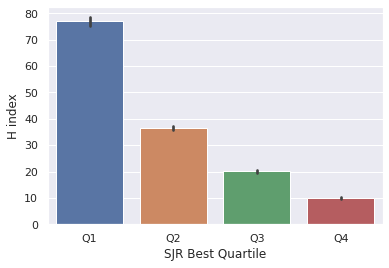

In [ ]:
# visualize the H-index distributions according to the SJR Best Quartile
sf3 = sf2[sf2['SJR Best Quartile'] != '-']
df = sf3.to_dataframe()
sns.barplot(x="SJR Best Quartile", y="H index",  data=df)

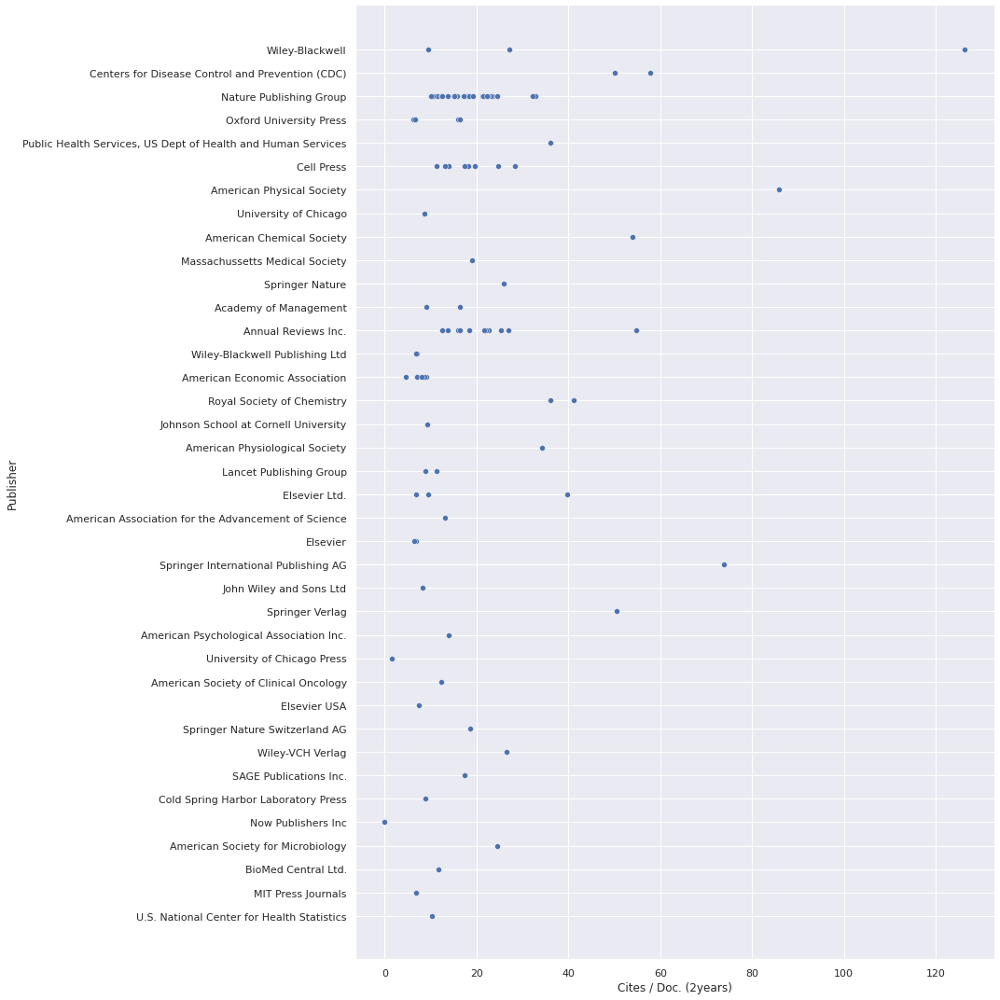

In [ ]:
# Using a grid, visualize the Cites / Doc. (2years) histograms values of each publisher
df = sf2.to_dataframe().head(100)
sns.relplot(x="Cites / Doc. (2years)", y="Publisher", data=df, height=15)
